<a href="https://colab.research.google.com/github/FatimaTanvir/UR5_SurgicalTools/blob/main/SurgicalToolsDetections.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Surgical tool Detection using YOLOv5

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16965, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (111/111), done.
remote: Total 16965 (delta 81), reused 99 (delta 49), pack-reused 16805 (from 1)
Receiving objects: 100% (16965/16965), 15.70 MiB | 17.56 MiB/s, done.
Resolving deltas: 100% (11610/11610), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.7/881.7 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.2 MB/s eta 0:00:00
Setup complete. Using torch 2.4.1+cu121 (Tesla T4)


# Getting custom labeled dataset from Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="wLC7oQ1zr21kcgSZUbcI")
project = rf.workspace("doedsum24").project("ur5-tazti")
version = project.version(4)
dataset = version.download("yolov5")



# Training The YOLOv5 Model

Model 1: Runtime: 0.551 hours

Model 2: Runtime: 0.198 hours

Model 3: Runtime: 0.164 hours

In [ ]:
!python train.py --img 640 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5m.pt --device 0 --half --cache --save-period 10 --augment


python3: can't open file '/content/train.py': [Errno 2] No such file or directory


# Showing Training Results using TensorBoard

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10957), started 0:46:25 ago. (Use '!kill 10957' to kill it.)

<IPython.core.display.Javascript object>

# Prediction

Done on the training set (19 images)

In [ ]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/test/images

detect: weights=['runs/train/exp3/weights/best.pt'], source=/content/yolov5/UR5-4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-348-g6deb2d75 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7039792 parameters, 0 gradients, 15.8 GFLOPs
image 1/19 /content/yolov5/UR5-4/test/images/109_png.rf.c3ba5fc152b56207c9a3158c711a225d.jpg: 256x416 1 Mosquito-Forceps-Curved, 51.3ms
image 2/19 /content/yolov5/UR5-4/test/images/10_png.rf.5809c448f82e7bf275ff5b7f3aada434.jpg: 256x416 1 Allis-Tissue-Forceps, 6.0ms
image 3/19 /content/yolov5/UR5-4/test/images/121

# Showing inference images

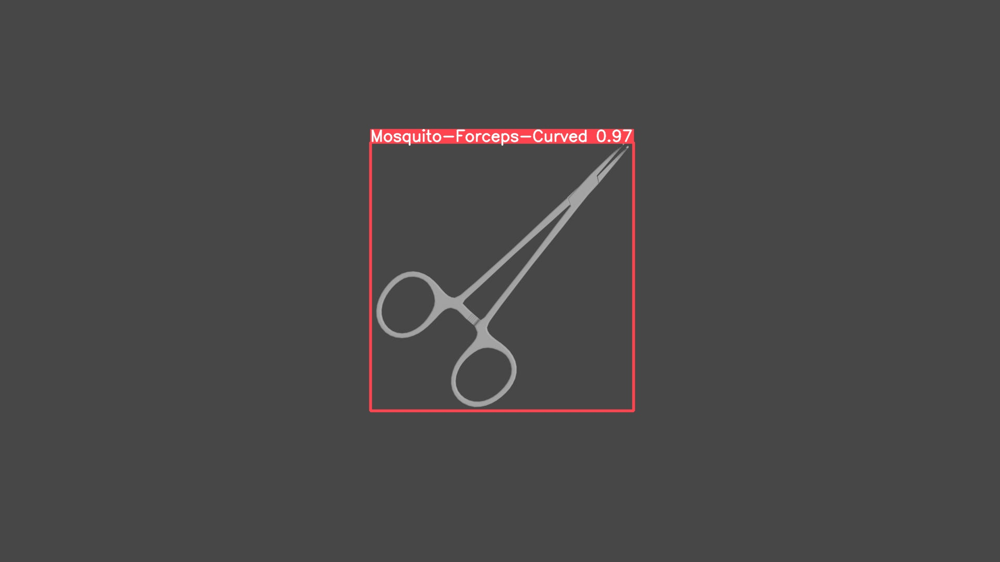

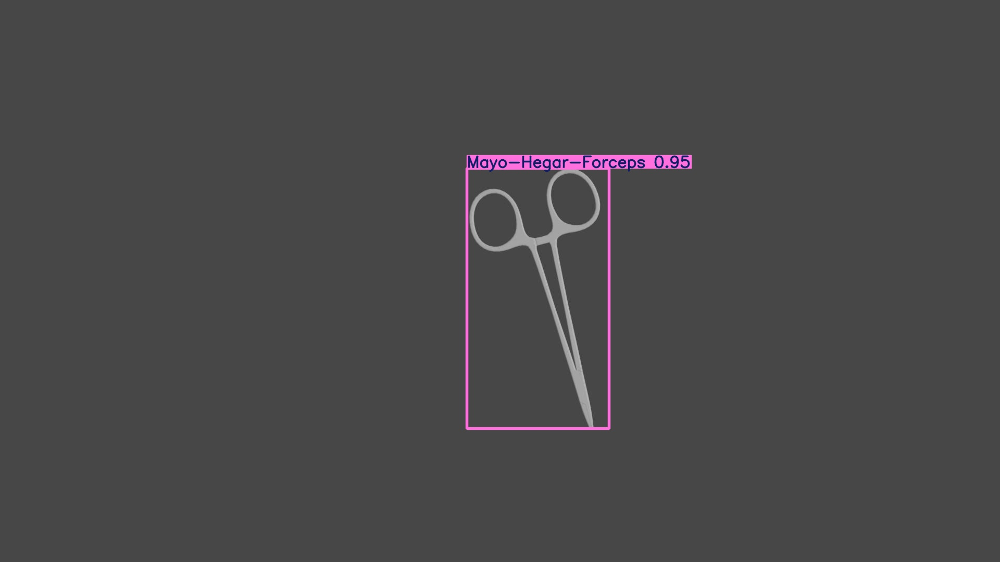

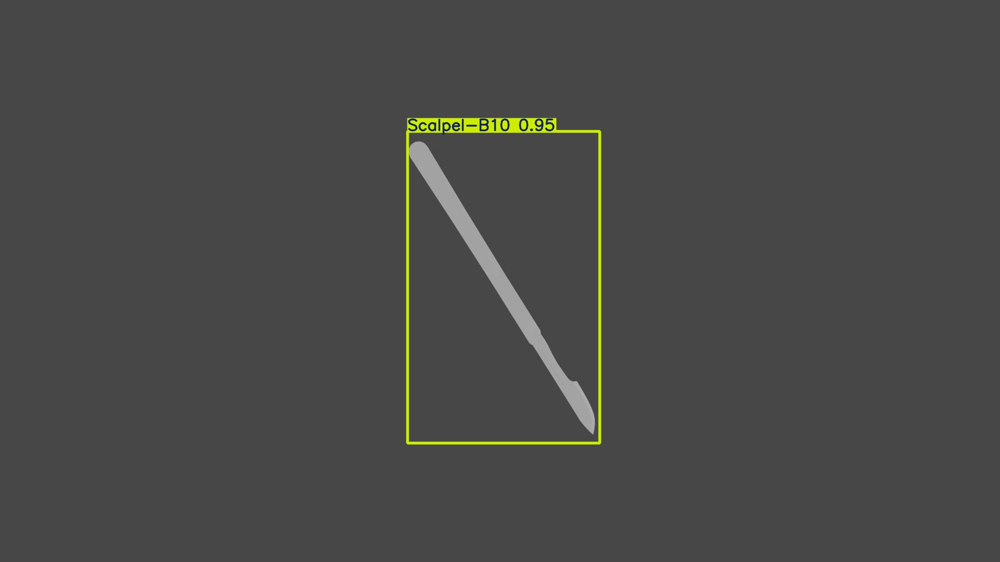

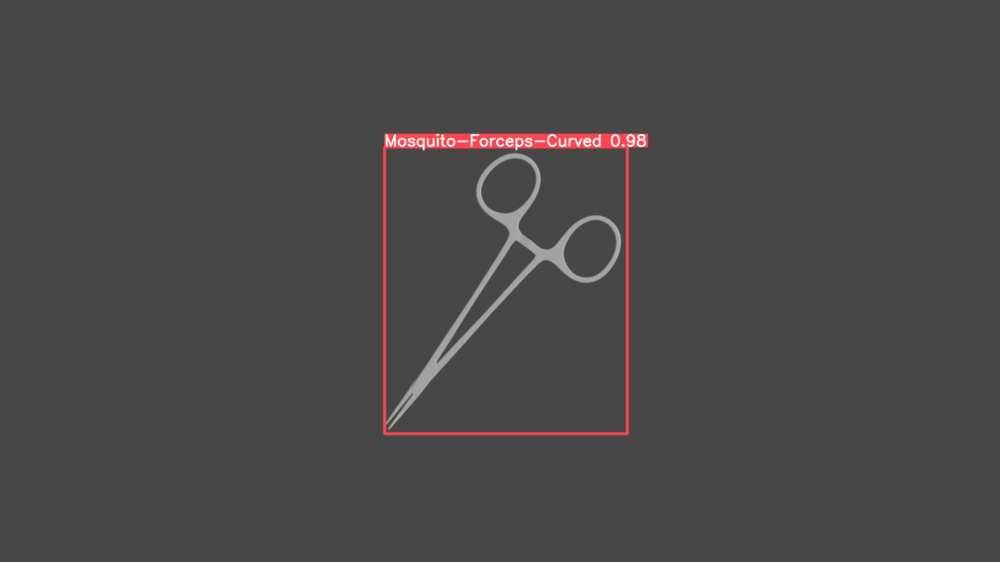

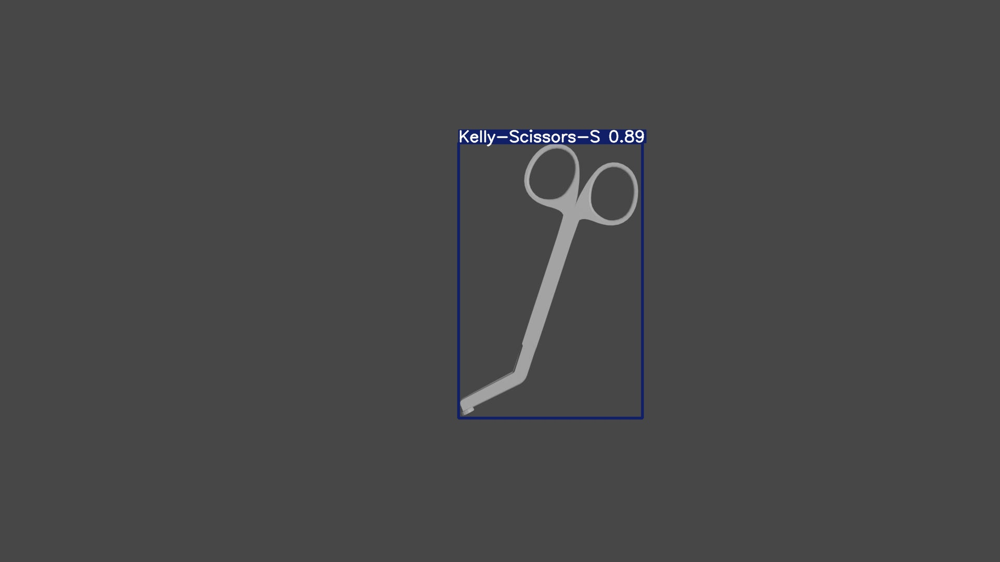

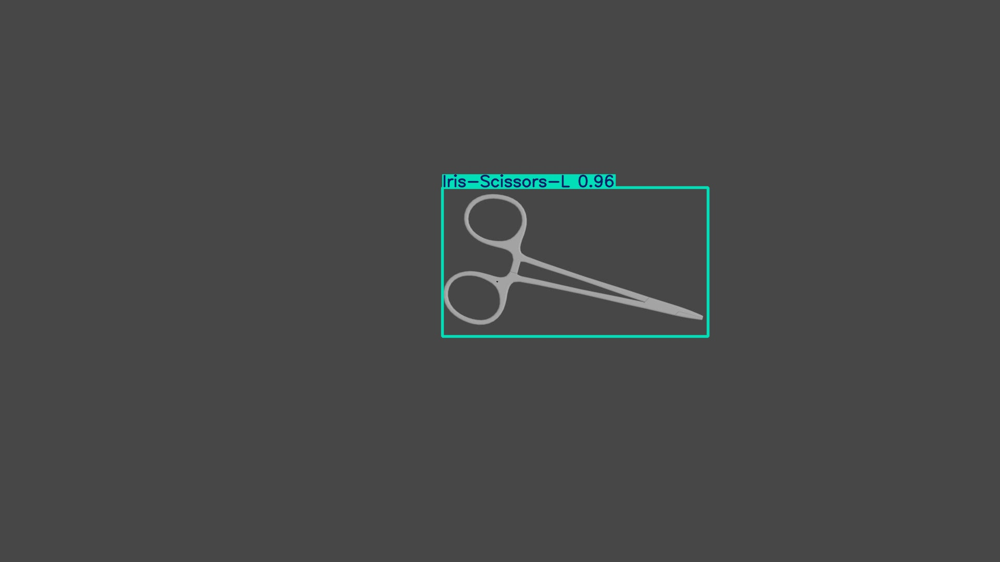

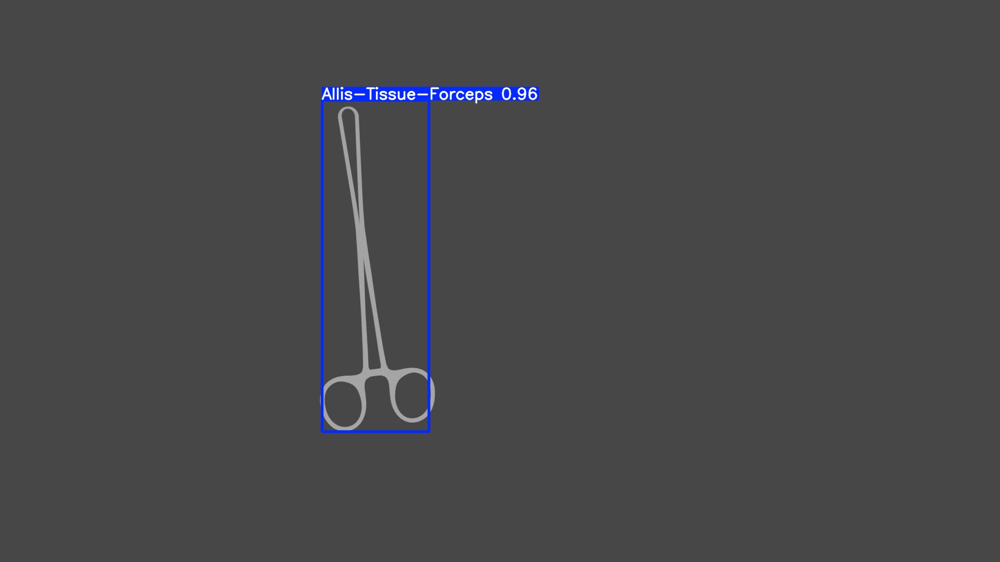

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Make sure to choose the correct exp folder
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    i += 1

    if i < 8:
      display(Image(filename=imageName))
      print("\n")

# Saving the model in .pt

In [ ]:
#export model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>